# Research question 3 - What is the difference in topics discussed between Western and Non-Western countries? 

Topics was extracted from the entire corpus containing reviews from all cities using Short Text Topic Modeling. The adoption of each topic will be measured in each country to compare language use in Western and non-Western countries. The adoption metric will be computed using following equation: %adp(t)=  (∑_(r∈R)▒〖f(t,r)〗)/n_r   x 100, where R is a set of reviews, r is a single review belonging to R, t is a considered topic, n_r is a number of all reviews and f(t,r) is a weight of the topic in the review. Apart from that, we can see the topic evolution over time, how topics relate with short or long reviews and how topics relate with sentiment.

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Setup" data-toc-modified-id="Setup-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Setup</a></span><ul class="toc-item"><li><span><a href="#Imports" data-toc-modified-id="Imports-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Imports</a></span></li><li><span><a href="#Styles" data-toc-modified-id="Styles-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Styles</a></span></li><li><span><a href="#Read-data" data-toc-modified-id="Read-data-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Read data</a></span></li></ul></li><li><span><a href="#Number-of-words-in-reviews-by-sentence-topics" data-toc-modified-id="Number-of-words-in-reviews-by-sentence-topics-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Number of words in reviews by sentence topics</a></span></li><li><span><a href="#Frequency-of-topics-in-Western-and-Non-Western-countries" data-toc-modified-id="Frequency-of-topics-in-Western-and-Non-Western-countries-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Frequency of topics in Western and Non-Western countries</a></span></li><li><span><a href="#Percentage-of-topics-by-city" data-toc-modified-id="Percentage-of-topics-by-city-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Percentage of topics by city</a></span></li><li><span><a href="#Mean-sentiment-by-topic" data-toc-modified-id="Mean-sentiment-by-topic-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Mean sentiment by topic</a></span></li></ul></div>

## Setup

### Imports

In [1]:
import numpy as np
import pandas as pd
import pickle

import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

### Styles

In [2]:
def set_plot_styles(styles):
    mpl.rcParams.update(mpl.rcParamsDefault)
    plt.style.use(styles)
    
set_plot_styles(['mplstyle.config'])
color = sns.color_palette('tab20')

### Read data

In [3]:
with open('data_with_topics_all_freq_all', 'rb') as f:
    data = pickle.load(f)

In [4]:
data.head()

,id,date,comments,host_id,neighbourhood_cleansed,city,latitude,longitude,number_of_reviews,first_review,...,comments_to_sentences,sentiment_sentences,type,tokens,data_lemmatized,data_lemmatized_freq,sentence_count,first_sentence_index,sentence_topic,sentence_topic_prob
0,13913,2010-08-18,My girlfriend and I hadn't known Alina before ...,54730,Islington,London,51.56802,-0.11121,21,2010-08-18,...,[My girlfriend and I had not known Alina befor...,"[0, 0, 1, 0, 1, 0, 0, 0, 0, 1]",Western,"[[my, girlfriend, and, had, not, known, alina,...","[[girlfriend, know, take, leap, faith, rent], ...","[[girlfriend, know, take, leap, faith, rent], ...",10,0,"[Experience, Other, Other, Other, Location, []...","[0.7815883986461568, 0.19150870152390334, 0.30..."
1,13913,2011-07-11,Alina was a really good host. The flat is clea...,54730,Islington,London,51.56802,-0.11121,21,2010-08-18,...,"[Alina was a really good host., The flat is cl...","[0, 0, 0]",Western,"[[alina, was, really, good, host], [the, flat,...","[[host], [finsbury, park, station], [recommend]]","[[host], [finsbury, park, station], [recommend]]",3,10,"[Other, Location, Experience]","[0.31272632303744097, 0.999029223577597, 0.876..."
2,13913,2011-09-13,Alina is an amazing host. She made me feel rig...,54730,Islington,London,51.56802,-0.11121,21,2010-08-18,...,"[Alina is an amazing host., She made me feel r...","[1, 0, 1, 1, 0, 0, 1]",Western,"[[alina, is, an, amazing, host], [she, made, m...","[[host], [make, feel, home], [hang, friend, st...","[[host], [make, feel, home], [hang, friend, st...",7,13,"[Other, Experience, Experience, Facilities, Fa...","[0.31272632303744097, 0.9929232579055125, 0.72..."
3,13913,2011-10-03,"Alina's place is so nice, the room is big and ...",54730,Islington,London,51.56802,-0.11121,21,2010-08-18,...,[Alina s place is so nice the room is big and ...,"[1, 1, 0, 1]",Western,"[[alina, place, is, so, nice, the, room, is, b...","[[room, bed], [host, make, need, instance, put...","[[room, bed], [host, make, need, instance, put...",4,20,"[Property - inside, Facilities, Host advices, ...","[0.7272363775074547, 0.5388052616205787, 0.986..."
4,13913,2011-10-09,"Nice location in Islington area, good for shor...",54730,Islington,London,51.56802,-0.11121,21,2010-08-18,...,[Nice location in Islington area good for shor...,"[1, 1]",Western,"[[nice, location, in, islington, area, good, f...","[[location, area, business, trip], [host]]","[[location, area, business, trip], [host]]",2,24,"[Value for money, Other]","[0.8053933270336349, 0.31272632303744097]"


In [62]:
data.comments_cleaned[121]

'Another fantastic stay at Amanda s lovely spacious comfortable apartment. Such a convenient location with great amenities nearby. The parking space is a great bonus for us too. Thank you so much for having us we will be back again soon'

In [63]:
data.sentence_topic[121]

['Experience', 'Value for money', 'Property - surroundings', 'Experience']

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3557399 entries, 0 to 3557398
Data columns (total 33 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   id                          int64  
 1   date                        object 
 2   comments                    object 
 3   host_id                     int64  
 4   neighbourhood_cleansed      object 
 5   city                        object 
 6   latitude                    float64
 7   longitude                   float64
 8   number_of_reviews           int64  
 9   first_review                object 
 10  last_review                 object 
 11  review_scores_rating        float64
 12  top_language                object 
 13  language                    object 
 14  language_probability        float64
 15  comments_ascii              object 
 16  comments_expanded           object 
 17  comments_cleaned            object 
 18  review_word_count           int64  
 19  year                 

## Number of words in reviews by sentence topics

In [11]:

topic_with_sentences_df_western = data[data.type=='Western'].apply(lambda row: dict([(topic, row['review_word_count']) 
                                                                                     for topic in set(filter(None, row['sentence_topic']))]), axis=1)

In [12]:

topic_with_sentences_df_non_western = data[data.type=='Non-Western'].apply(lambda row: dict([(topic, row['review_word_count']) 
                                                                                     for topic in set(filter(None, row['sentence_topic']))]), axis=1)

In [13]:
topic_with_sentences_df_western

0          {'Stay': 152, 'Location': 152, 'Other': 152, '...
1          {'Host': 31, 'Recommendation': 31, 'Location':...
2          {'Host': 70, 'Recommendation': 70, 'Location':...
3          {'Host': 87, 'Room': 87, 'Recommendation': 87,...
4                                   {'Stay': 17, 'Host': 17}
                                 ...                        
2667354    {'Stay': 131, 'Experience': 131, 'View': 131, ...
2667355               {'Recommendation': 29, 'Location': 29}
2667356                   {'Host': 17, 'Recommendation': 17}
2667357                     {'Host': 9, 'Recommendation': 9}
2667358    {'Host': 148, 'Room': 148, 'Recommendation': 1...
Length: 2667359, dtype: object

In [14]:
topic_with_sentences_df_non_western

2667359        {'Host': 38, 'Experience': 38, 'Arrival': 38}
2667360    {'Stay': 155, 'Experience': 155, 'Arrival': 15...
2667361    {'Experience': 53, 'Host': 53, 'Recommendation...
2667362    {'Host': 68, 'Recommendation': 68, 'Location':...
2667363    {'Host': 53, 'Recommendation': 53, 'Location':...
                                 ...                        
3557394    {'Host': 44, 'Room': 44, 'Recommendation': 44,...
3557395    {'Recommendation': 59, 'Location': 59, 'Other'...
3557396                               {'Recommendation': 16}
3557397                               {'Recommendation': 11}
3557398                               {'Recommendation': 11}
Length: 890040, dtype: object

In [15]:
topic_with_sentences_western = dict()
for list1dsasdasdsadas in topic_with_sentences_df_western.tolist():
    for key, value in list1.items():
        b = topic_with_sentences_western.get(key, [])
        b.append(value)
        topic_with_sentences_western[key] = b

In [16]:
topic_with_sentences_non_western = dict()
for list1 in topic_with_sentences_df_non_western.tolist():
    for key, value in list1.items():
        b = topic_with_sentences_non_western.get(key, [])
        b.append(value)
        topic_with_sentences_non_western[key] = b

In [17]:
topic_ids = set([key for key in topic_with_sentences_western.keys()] + [key for key in topic_with_sentences_non_western.keys()])
topic_merged = {}
for topic_id in topic_ids:
    topic_merged[topic_id] = [topic_with_sentences_western.get(topic_id, []), topic_with_sentences_non_western.get(topic_id, [])]
    

In [18]:
fig, ax = plt.subplots(6, 2, figsize=(20, 30), sharey=True)

i=0
j=0
for key, val in topic_merged.items():
    sns.distplot(val[0], ax=ax[i, j], label='Western')
    sns.distplot(val[1], ax=ax[i, j], label='Non-Western')
    ax[i, j].set_title(str(key))
    ax[i, j].legend()
    j = j + 1
    if j > 1: 
        i = i + 1
        j = 0

plt.show()

## Frequency of topics in Western and Non-Western countries

In [12]:
from collections import Counter

In [13]:
topics_in_sentences_by_type = data.groupby('type')['sentence_topic'].apply(lambda topics: 
                                                                            Counter([item for topic in topics 
                                                                                     for item in filter(None, topic)])).rename('topic_count').reset_index()

In [14]:
topics_in_sentences_by_type.groupby('type')['topic_count'].sum()

type
Non-Western    3666489
Western        9963373
Name: topic_count, dtype: int64

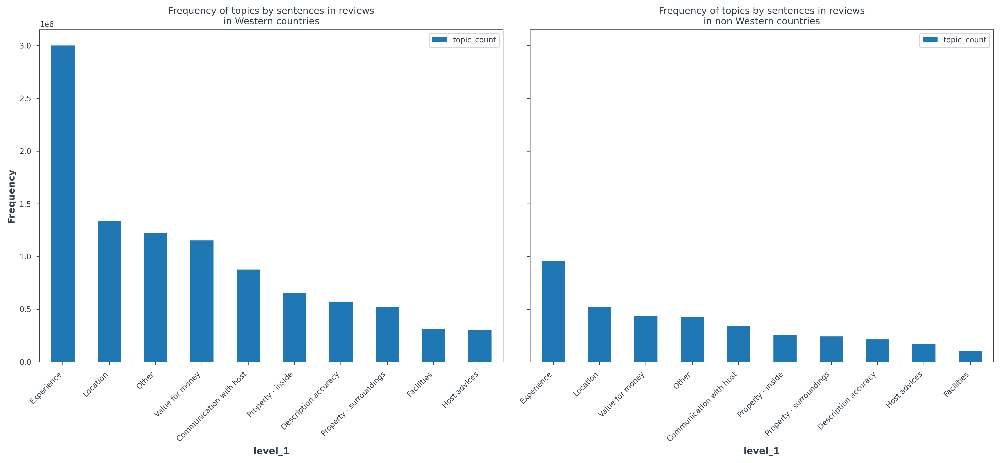

In [15]:
fig, ax = plt.subplots(1, 2, figsize=(15, 7), sharey=True)

ax1 = topics_in_sentences_by_type[topics_in_sentences_by_type.type=='Western'].sort_values(by='topic_count', ascending=False).plot(kind='bar', x='level_1', y='topic_count', ax=ax[0])
ax1.set_title('Frequency of topics by sentences in reviews\nin Western countries')
ax1.set_ylabel('Frequency')
ax1.xaxis.set_tick_params(rotation=45)
plt.setp(ax1.get_xticklabels(), rotation=45, ha='right')

ax2 = topics_in_sentences_by_type[topics_in_sentences_by_type.type=='Non-Western'].sort_values(by='topic_count', ascending=False).plot(kind='bar', x='level_1', y='topic_count', ax=ax[1])
ax2.set_title('Frequency of topics by sentences in reviews\nin non Western countries')
ax2.set_ylabel('Frequency')
plt.setp(ax2.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show();

In [16]:
f = lambda x: round(100 * x / float(x.sum()))
topics_in_sentences_by_type['topic_perc'] = topics_in_sentences_by_type.groupby(['type'])['topic_count'].transform(f)
topics_in_sentences_by_type

,type,level_1,topic_count,topic_perc
0,Non-Western,Description accuracy,214151,6
1,Non-Western,Communication with host,342961,9
2,Non-Western,Experience,954671,26
3,Non-Western,Property - inside,256859,7
4,Non-Western,Value for money,436575,12
5,Non-Western,Location,524726,14
6,Non-Western,Other,425895,12
7,Non-Western,Host advices,167167,5
8,Non-Western,Property - surroundings,242960,7
9,Non-Western,Facilities,100524,3


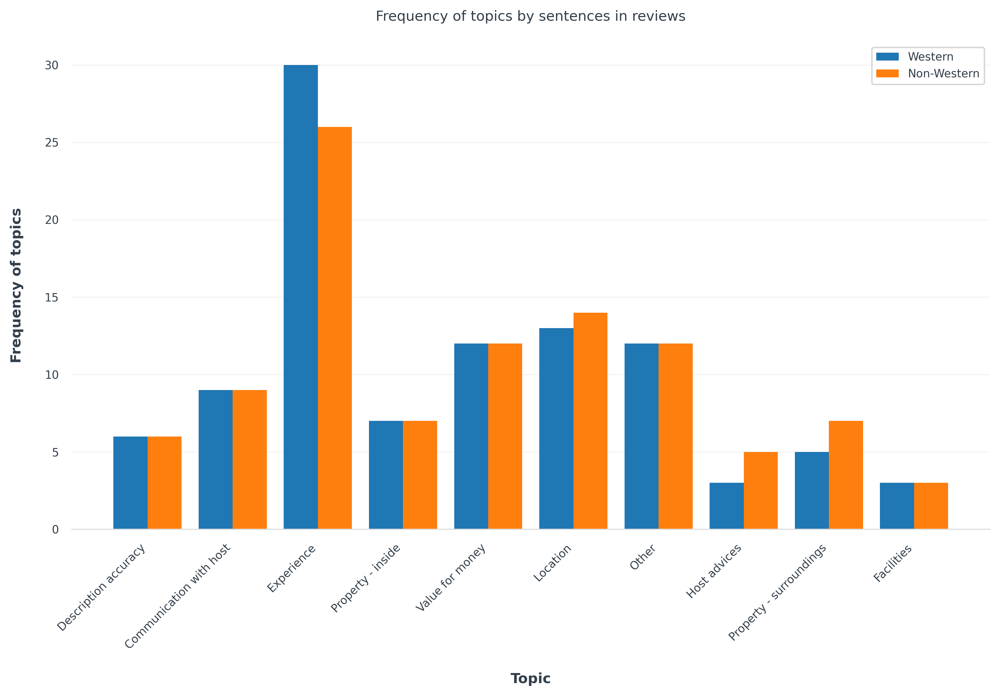

In [17]:
fig, ax = plt.subplots(figsize=(10, 7))

x = np.arange(len(topics_in_sentences_by_type.level_1.unique()))
bar_width = 0.4

b1 = ax.bar(x, topics_in_sentences_by_type[topics_in_sentences_by_type.type=='Western']['topic_perc'],
            width=bar_width, label='Western')

b2 = ax.bar(x + bar_width, topics_in_sentences_by_type[topics_in_sentences_by_type.type=='Non-Western']['topic_perc'],
            width=bar_width, label='Non-Western')

ax.set_xticks(x + bar_width / 2)
ax.set_xticklabels(topics_in_sentences_by_type.level_1.unique())

ax.legend()

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_color('#DDDDDD')
ax.tick_params(bottom=False, left=False)
ax.set_axisbelow(True)
ax.yaxis.grid(True, color='#EEEEEE')
ax.xaxis.grid(False)

ax.set_xlabel('Topic', labelpad=15)
ax.set_ylabel('Frequency of topics', labelpad=15)
ax.set_title('Frequency of topics by sentences in reviews', pad=15)

plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
fig.tight_layout()

plt.show()

## Percentage of topics by city

In [18]:
topics_in_sentences_by_city = data.groupby(['type', 'city'])['sentence_topic'].apply(lambda topics: 
                                                                            Counter([item for topic in topics 
                                                                                     for item in filter(None, topic)])).rename('topic_count').reset_index()
topics_in_sentences_by_city['topic_perc'] = topics_in_sentences_by_city.groupby(['type', 'city'])['topic_count'].transform(f)
topics_in_sentences_by_city

,type,city,level_2,topic_count,topic_perc
0,Non-Western,Beijing,Description accuracy,5336,6
1,Non-Western,Beijing,Communication with host,8319,10
2,Non-Western,Beijing,Experience,23129,27
3,Non-Western,Beijing,Property - inside,6271,7
4,Non-Western,Beijing,Value for money,7785,9
...,...,...,...,...,...
125,Western,Vancouver,Location,85010,13
126,Western,Vancouver,Other,73398,12
127,Western,Vancouver,Host advices,20456,3
128,Western,Vancouver,Property - surroundings,40126,6


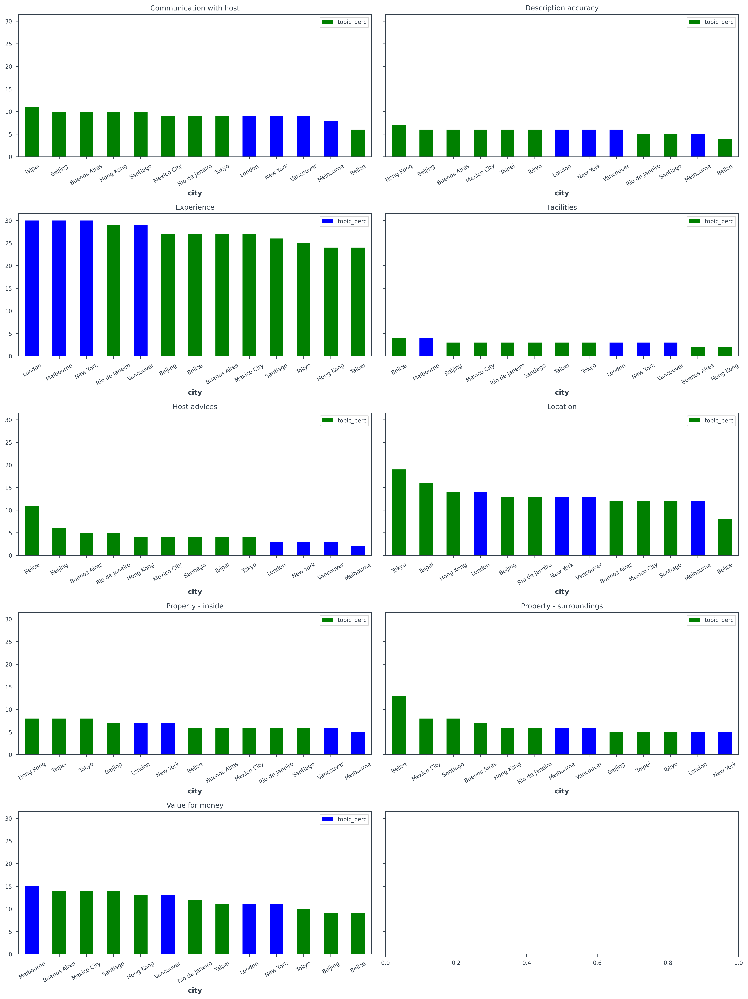

In [19]:
fig, ax = plt.subplots(5, 2, figsize=(15, 20), sharey=True)

i=0
j=0
for topic in sorted(topics_in_sentences_by_city.level_2[topics_in_sentences_by_city.level_2 != 'Other'].dropna().unique()):
    
    topic_df = topics_in_sentences_by_city[topics_in_sentences_by_city.level_2==topic].sort_values(by='topic_perc', ascending=False)
    topic_df.plot(kind='bar', x='city', y='topic_perc', color=topic_df.type.map({'Western': 'b', 'Non-Western': 'g'}), ax=ax[i, j])
    ax[i, j].set_title(str(topic))
    plt.setp(ax[i, j].get_xticklabels(), rotation=30, ha='center') 
    j = j + 1
    if j > 1: 
        i = i + 1
        j = 0

plt.tight_layout()
plt.show()

In [20]:
topics_in_sentences_by_city_by_year = data.groupby(['type', 'city', 'year'])['sentence_topic'].apply(lambda topics: 
                                                                            Counter([item for topic in topics 
                                                                                     for item in filter(None, topic)])).rename('topic_count').reset_index()
topics_in_sentences_by_city_by_year['topic_perc'] = topics_in_sentences_by_city_by_year.groupby(['type', 'city', 'year'])['topic_count'].transform(f)
topics_in_sentences_by_city_by_year

,type,city,year,level_3,topic_count,topic_perc
0,Non-Western,Beijing,2010,Description accuracy,2.0,20.0
1,Non-Western,Beijing,2010,Communication with host,2.0,20.0
2,Non-Western,Beijing,2010,Experience,2.0,20.0
3,Non-Western,Beijing,2010,Property - inside,1.0,10.0
4,Non-Western,Beijing,2010,Value for money,1.0,10.0
...,...,...,...,...,...,...
1425,Western,Vancouver,2020,Location,5448.0,11.0
1426,Western,Vancouver,2020,Other,5330.0,11.0
1427,Western,Vancouver,2020,Host advices,945.0,2.0
1428,Western,Vancouver,2020,Property - surroundings,2946.0,6.0


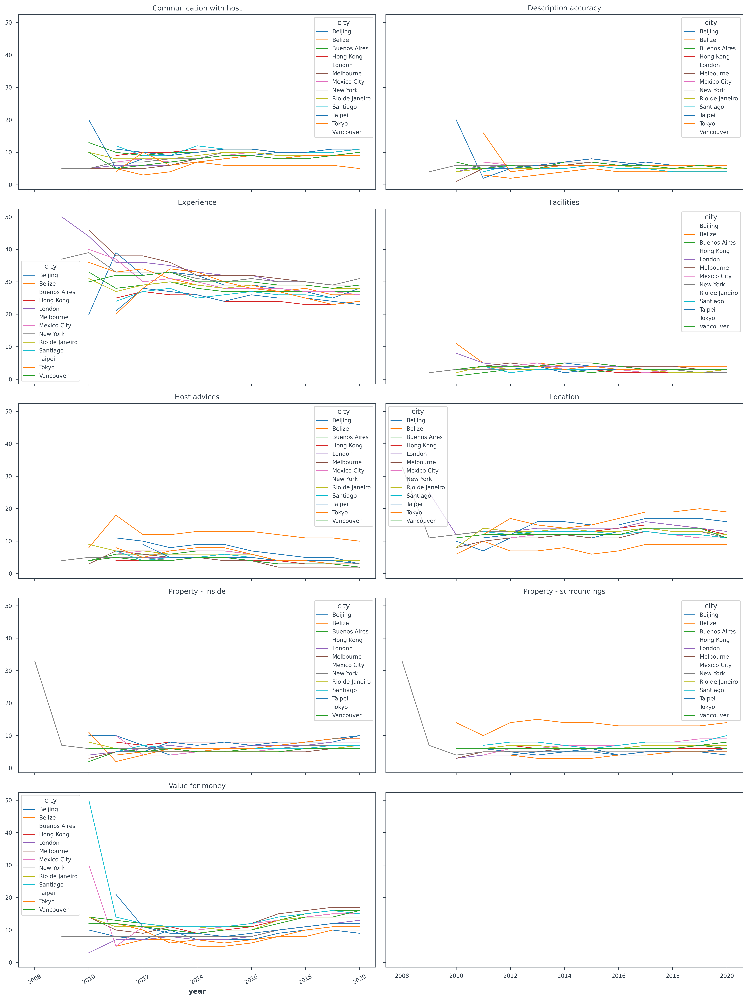

In [21]:
fig, ax = plt.subplots(5, 2, figsize=(15, 20), sharey=True, sharex=True)

i=0
j=0
for topic in sorted(topics_in_sentences_by_city_by_year.level_3[topics_in_sentences_by_city_by_year.level_3 != 'Other'].dropna().unique()):
    
    topic_df = topics_in_sentences_by_city_by_year[topics_in_sentences_by_city_by_year.level_3==topic]
    topic_df.pivot('year', 'city', 'topic_perc').plot(kind='line', ax=ax[i, j])
    ax[i, j].set_title(str(topic))
    plt.setp(ax[i, j].get_xticklabels(), rotation=30, ha='center') 
    j = j + 1
    if j > 1: 
        i = i + 1
        j = 0

plt.tight_layout()
plt.show();

## Mean sentiment by topic

In [22]:
topic_sentiment_df = data[['city', 'sentence_topic', 'sentiment_sentences', 'type', 'year']]

In [23]:
topic_sentiment_df['topic_sentiment'] = topic_sentiment_df.apply(lambda row: list(zip(
    map(lambda topic: None if topic == [] else topic, row['sentence_topic']), 
    row['sentiment_sentences'])) , axis=1)

In [24]:
topic_sentiment_df = topic_sentiment_df.explode('topic_sentiment').reset_index()

In [25]:
topic_sentiment_df[['topic', 'sentiment']] = pd.DataFrame(topic_sentiment_df['topic_sentiment'].tolist(),index=topic_sentiment_df.index)

In [26]:
topic_sentiment_df.head()

,index,city,sentence_topic,sentiment_sentences,type,year,topic_sentiment,topic,sentiment
0,0,London,"[Experience, Other, Other, Other, Location, []...","[0, 0, 1, 0, 1, 0, 0, 0, 0, 1]",Western,2010,"(Experience, 0)",Experience,0
1,0,London,"[Experience, Other, Other, Other, Location, []...","[0, 0, 1, 0, 1, 0, 0, 0, 0, 1]",Western,2010,"(Other, 0)",Other,0
2,0,London,"[Experience, Other, Other, Other, Location, []...","[0, 0, 1, 0, 1, 0, 0, 0, 0, 1]",Western,2010,"(Other, 1)",Other,1
3,0,London,"[Experience, Other, Other, Other, Location, []...","[0, 0, 1, 0, 1, 0, 0, 0, 0, 1]",Western,2010,"(Other, 0)",Other,0
4,0,London,"[Experience, Other, Other, Other, Location, []...","[0, 0, 1, 0, 1, 0, 0, 0, 0, 1]",Western,2010,"(Location, 1)",Location,1


In [27]:
topic_sentiment_type_city_mean = topic_sentiment_df[['type', 'city', 'topic', 'sentiment']].groupby(
                                                        ['type', 'city', 'topic'])['sentiment'].mean().reset_index()
topic_sentiment_type_city_mean

,type,city,topic,sentiment
0,Non-Western,Beijing,Communication with host,0.376608
1,Non-Western,Beijing,Description accuracy,0.444715
2,Non-Western,Beijing,Experience,0.529768
3,Non-Western,Beijing,Facilities,0.428317
4,Non-Western,Beijing,Host advices,0.471935
...,...,...,...,...
125,Western,Vancouver,Location,0.453629
126,Western,Vancouver,Other,0.602332
127,Western,Vancouver,Property - inside,0.440939
128,Western,Vancouver,Property - surroundings,0.417186


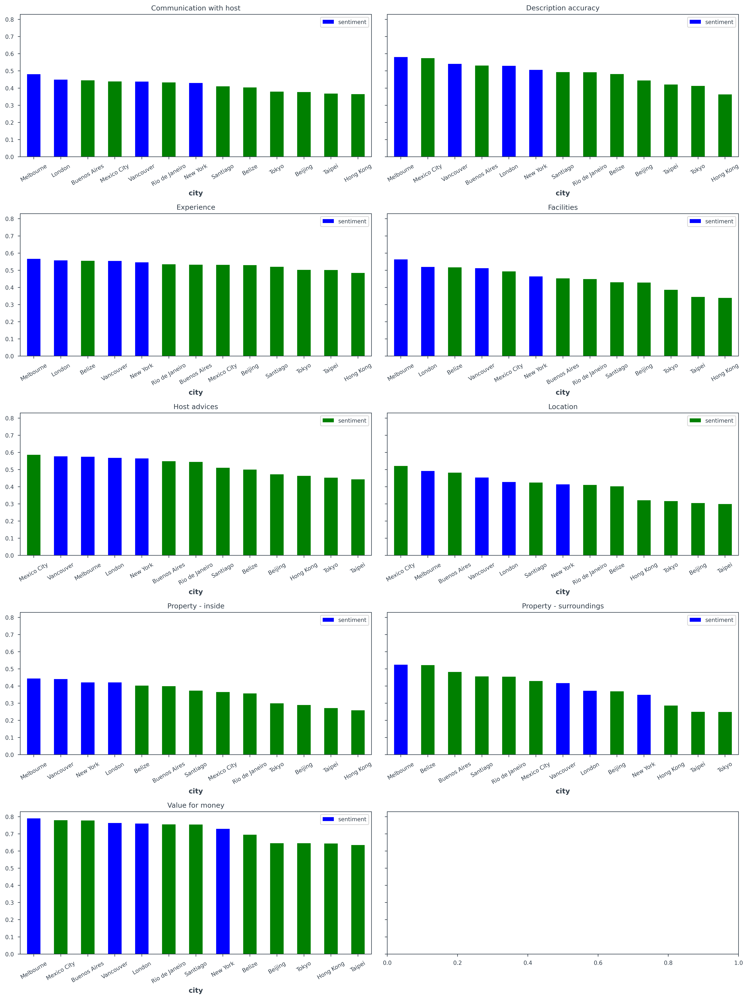

In [28]:
fig, ax = plt.subplots(5, 2, figsize=(15, 20), sharey=True)

i=0
j=0
for topic in sorted(topic_sentiment_df.topic[topic_sentiment_df.topic != 'Other'].dropna().unique()):
    
    topic_df = topic_sentiment_type_city_mean[topic_sentiment_type_city_mean.topic==topic].sort_values(by='sentiment', ascending=False)
    topic_df.plot(kind='bar', x='city', y='sentiment', color=topic_df.type.map({'Western': 'b', 'Non-Western': 'g'}), ax=ax[i, j])
    ax[i, j].set_title(str(topic))
    plt.setp(ax[i, j].get_xticklabels(), rotation=30, ha='center') 
    j = j + 1
    if j > 1: 
        i = i + 1
        j = 0
    
plt.tight_layout()
plt.show()

In [29]:
topic_sentiment_type_city_year_mean = topic_sentiment_df[['type', 'city', 'year', 'topic', 'sentiment']].groupby(
                                                        ['type', 'city', 'year', 'topic'])['sentiment'].mean().reset_index()
topic_sentiment_type_city_year_mean

,type,city,year,topic,sentiment
0,Non-Western,Beijing,2010,Communication with host,0.000000
1,Non-Western,Beijing,2010,Description accuracy,0.000000
2,Non-Western,Beijing,2010,Experience,1.000000
3,Non-Western,Beijing,2010,Location,0.000000
4,Non-Western,Beijing,2010,Other,1.000000
...,...,...,...,...,...
1385,Western,Vancouver,2020,Location,0.468979
1386,Western,Vancouver,2020,Other,0.579174
1387,Western,Vancouver,2020,Property - inside,0.392482
1388,Western,Vancouver,2020,Property - surroundings,0.423965


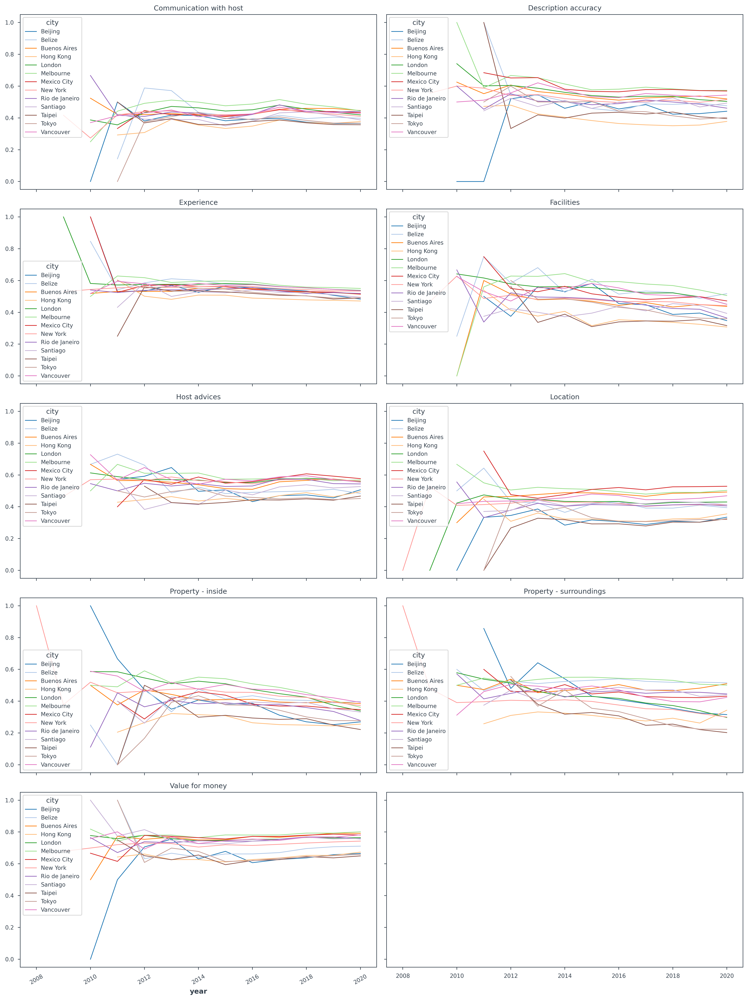

In [30]:
fig, ax = plt.subplots(5, 2, figsize=(15, 20), sharey=True, sharex=True)

i=0
j=0
for topic in sorted(topic_sentiment_type_city_year_mean.topic[topic_sentiment_type_city_year_mean.topic != 'Other'].dropna().unique()):
    
    topic_df = topic_sentiment_type_city_year_mean[topic_sentiment_type_city_year_mean.topic==topic]
    topic_df.pivot('year', 'city', 'sentiment').plot(kind='line', ax=ax[i, j], color=color)
    ax[i, j].set_title(str(topic))
    plt.setp(ax[i, j].get_xticklabels(), rotation=30, ha='center') 
    j = j + 1
    if j > 1: 
        i = i + 1
        j = 0

plt.tight_layout()
plt.show();

In [31]:
with open('model_mgp_all_freq_all', 'rb') as f:
     mgp = pickle.load(f)

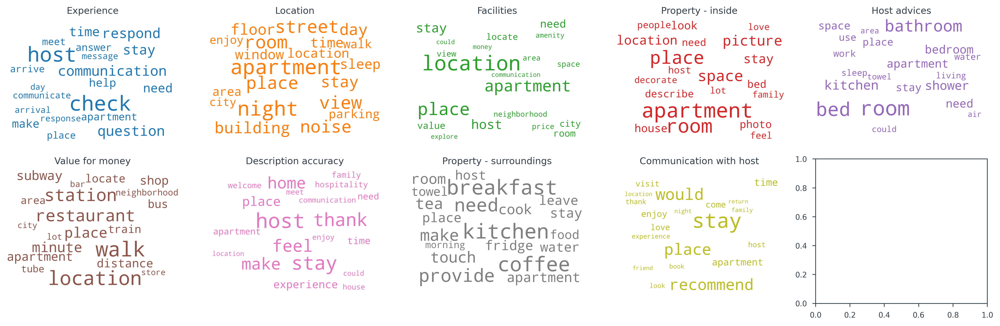

In [36]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

topic_names = topic_sentiment_df.topic[topic_sentiment_df.topic != 'Other'].dropna().unique()

cloud = WordCloud(background_color='white',
                  width=2500,
                  height=1800,
                  max_words=20,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = mgp.cluster_word_distribution

fig, axes = plt.subplots(2, 5, figsize=(15,5))

for i, ax in enumerate(axes.flatten()[:-1]):
    fig.add_subplot(ax)
    topic_words = topics[i]
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title(topic_names[i])
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()